In [1]:
from pygeotools.lib import geolib,iolib,warplib,malib
import numpy as np
import os,sys,glob,shutil
import matplotlib.pyplot as plt
from imview import pltlib
#from autoRIFT import autoRIFT

In [2]:
%matplotlib notebook


In [3]:
%cd /nobackup/sbhusha1/feature_tracking_wg/

/nobackupp11/sbhusha1/feature_tracking_wg


##### integer pixel shifts

In [38]:
vx_integer = 'vx_integer.tif'
vy_integer = 'vy_integer.tif'
vx_list = sorted(glob.glob('./multipixel_shifts/autoRIFT/*multi_pixel_synthetic_shift*/*-vx.tif'))
vy_list = sorted(glob.glob('./multipixel_shifts/autoRIFT/*multi_pixel_synthetic_shift*/*-vy.tif'))

<IPython.core.display.Javascript object>


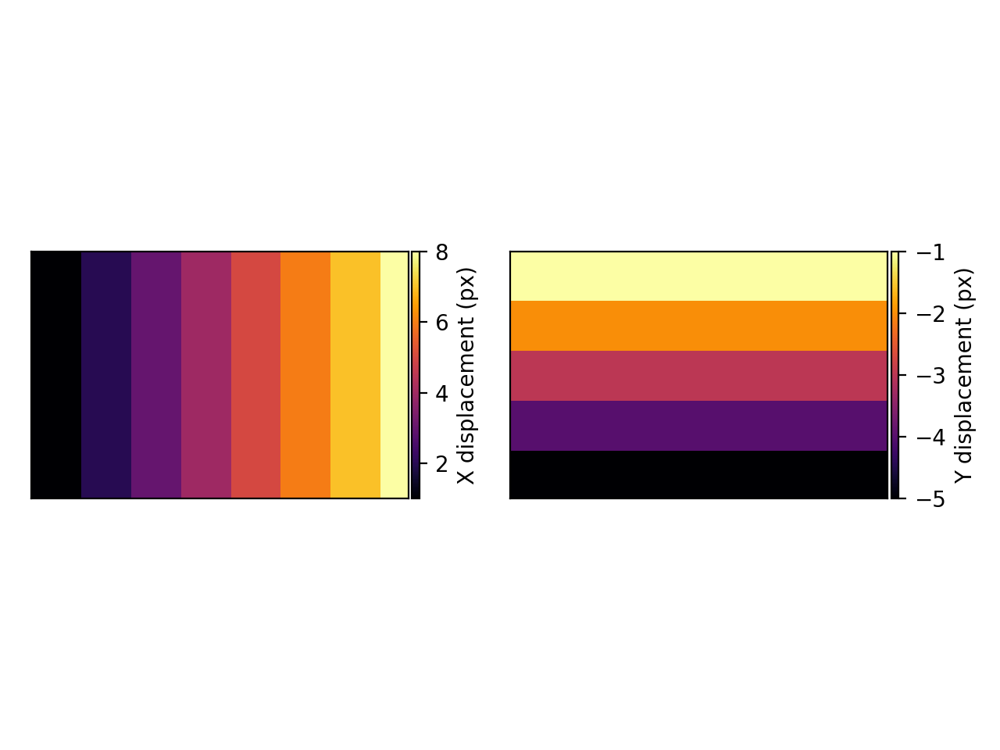

/nobackupp11/sbhusha1/sw/imview/imview/lib/pltlib.py:146: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("inferno"))
  cmap.set_bad('0.5', alpha=1)


<AxesSubplot:>

In [19]:
f,ax = plt.subplots(1,2)
pltlib.iv(iolib.fn_getma(vx_integer),cmap='inferno',ax=ax[0],
         label='X displacement (px)')
pltlib.iv(iolib.fn_getma(vy_integer),cmap='inferno',ax=ax[1],
         label='Y displacement (px)')

<IPython.core.display.Javascript object>


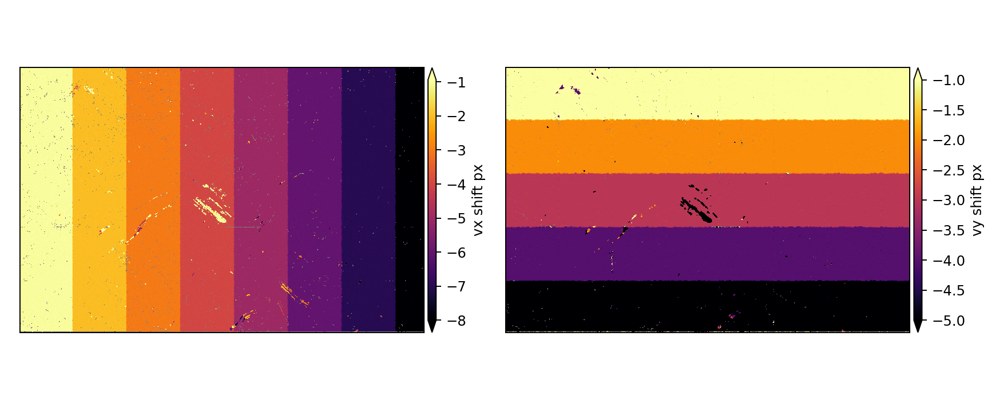

/nobackupp11/sbhusha1/sw/imview/imview/lib/pltlib.py:146: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("inferno"))
  cmap.set_bad('0.5', alpha=1)


In [36]:
f,ax = plt.subplots(1,2,figsize=(10,4))
vx_solved,vy_solved = [iolib.fn_getma(x) for x in [vx_list[0],vy_list[1]]]
pltlib.iv(vx_solved,cmap='inferno',ax=ax[0],label='vx shift px')
pltlib.iv(vy_solved,cmap='inferno',ax=ax[1],label='vy shift px')
plt.tight_layout()

In [35]:
malib.get_stats_dict(iolib.fn_getma(vx_list[0]))

{'count': 2295697,
 'min': -7.5,
 'max': 5.46875,
 'ptp': 12.96875,
 'mean': -2.144938293794869,
 'std': 1.0981993880077303,
 'nmad': 1.4826,
 'med': -2.0,
 'median': -2.0,
 'p16': -3.5,
 'p84': -1.0,
 'spread': 1.25,
 'mode': -1.0}

In [53]:
malib.get_stats_dict(vx_input)

{'count': 9222617,
 'min': 1.0,
 'max': 8.0,
 'ptp': 7.0,
 'mean': 4.296819763847941,
 'std': 2.1817703366801298,
 'nmad': 2.9652,
 'med': 4.0,
 'median': 4.0,
 'p16': 2.0,
 'p84': 7.0,
 'spread': 2.5,
 'mode': 7.0}

In [8]:
def box_plot_prep(synthetic_shift,computed_shift):
    unique_vals = np.unique(synthetic_shift)
    print(f"Unique values are:{unique_vals}")
    out_vals_list = []
    for vals in unique_vals:
        idx = synthetic_shift == vals
        out_vals_list.append(computed_shift[idx].compressed())
    return unique_vals.compressed(),out_vals_list[:-1]

<IPython.core.display.Javascript object>


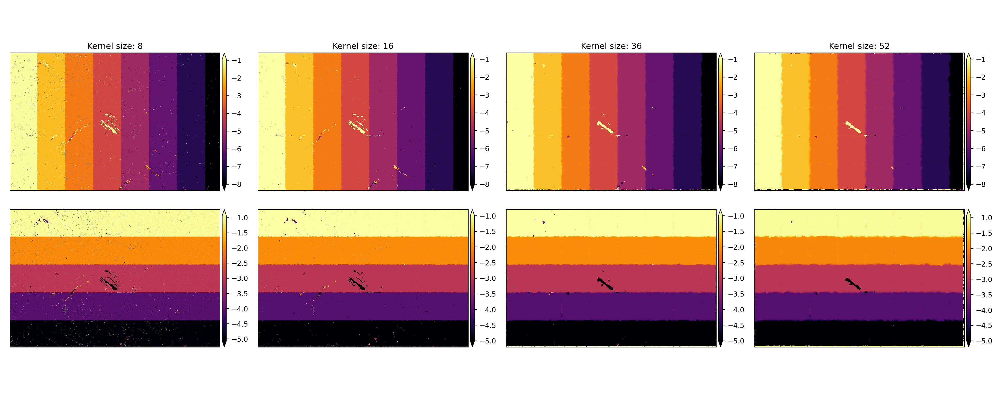

In [39]:
f,axa = plt.subplots(2,4,figsize=(20,8))
ax = axa.ravel()
kernels = [8,16,36,52]
# plot the x component first

#vx_list = [iolib.fn_getma(x,1) for x in spm1_refinement]
vx_list = [vx_list[-1]] + vx_list[:-1]
vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vx in enumerate(vx_list):
    pltlib.iv(iolib.fn_getma(vx),ax=ax[idx],cmap='inferno',
              title=f'Kernel size: {kernels[idx]}')

# now plot the y component first

#vy_list = [iolib.fn_getma(x,2) for x in spm1_refinement]
#vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    pltlib.iv(iolib.fn_getma(vy),ax=ax[idx+4],cmap='inferno')
plt.tight_layout()

In [7]:
def plot_synthetic_boxplot(ax,v_input,v_output):
    ds_list = warplib.memwarp_multi_fn([v_input,v_output],res='max',r='near')
    v_input,v_output = [iolib.ds_getma(ds) for ds in ds_list]
    v_input = np.ma.array(v_input,mask=v_output.mask)
    box_x,box_y = box_plot_prep(v_input,v_output)
    print(box_x)
    ax.boxplot(box_y, positions=box_x, sym='', widths=0.6,whis=(5,95))
    ax.grid(linestyle='--')


<IPython.core.display.Javascript object>


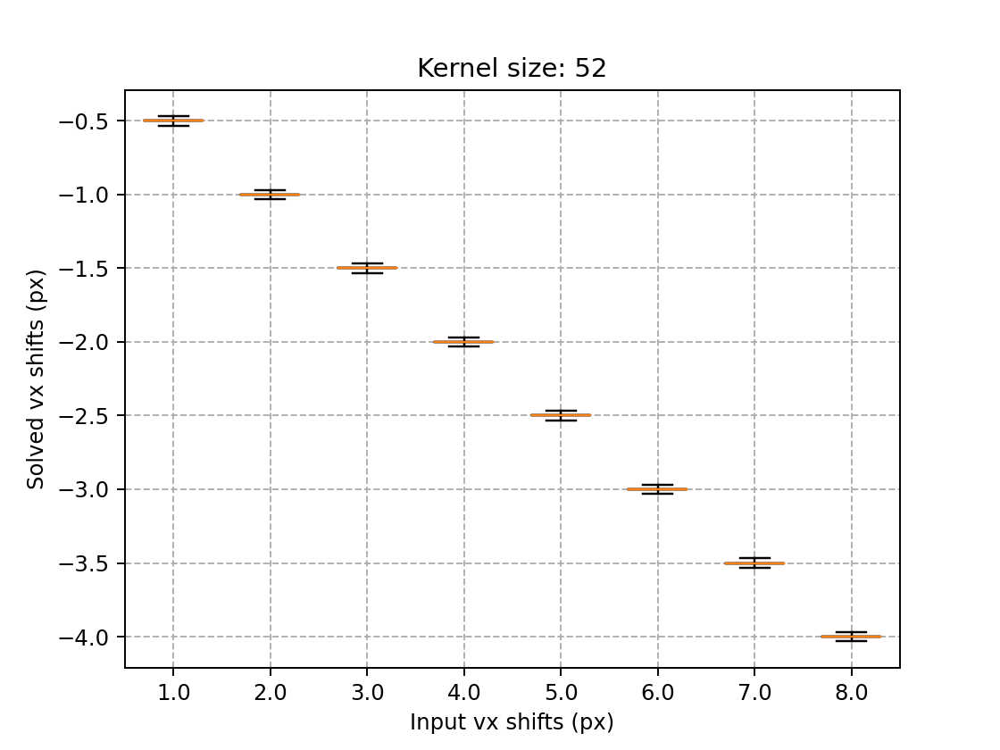


Warping all inputs to the following:
Resolution: 30.0
Extent: [585060.0, 6718005.0, 641550.0, 6754995.0]
Projection: '+proj=utm +zone=7 +datum=WGS84 +units=m +no_defs'
Resampling alg: near

1 of 2: vx_integer.tif
nl: 1233 ns: 1883 res: 30.000
2 of 2: ./multipixel_shifts/autoRIFT/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_multi_pixel_synthetic_shift_min_min_chip_8.0_max_chip_8.0_skip_rate_2/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_warp__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_multi_pixel_synthetic_shift_warp_15.0_min_chip_8.0_max_chip_8.0_skip_rate_2-vx.tif
Unique values are:[1.0 2.0 3.0 4.0 5.0 6.0 7.0 8.0 --]
[1. 2. 3. 4. 5. 6. 7. 8.]


Text(0, 0.5, 'Solved vx shifts (px)')

In [33]:
f,ax = plt.subplots()
plot_synthetic_boxplot(ax,vx_integer,vx_list[0])
ax.set_title(f'Kernel size: {kernels[idx]}')
ax.set_xlabel('Input vx shifts (px)')
ax.set_ylabel('Solved vx shifts (px)')


<IPython.core.display.Javascript object>


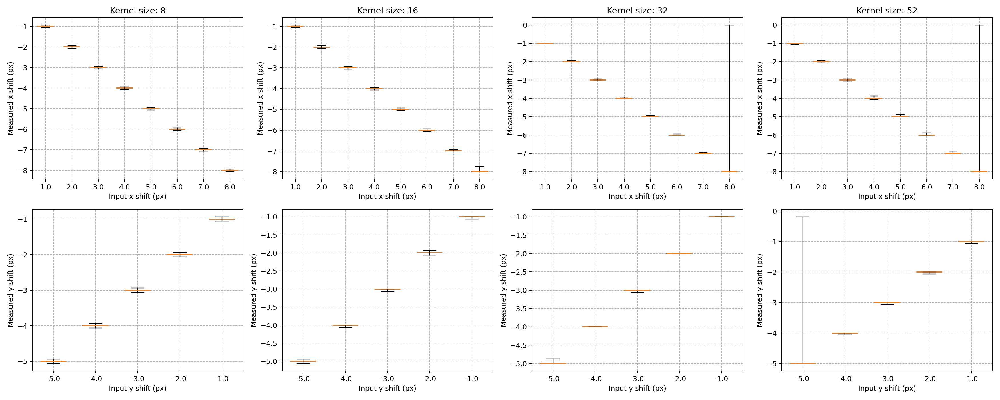


Warping all inputs to the following:
Resolution: 30.0
Extent: [585060.0, 6718005.0, 641550.0, 6754995.0]
Projection: '+proj=utm +zone=7 +datum=WGS84 +units=m +no_defs'
Resampling alg: near

1 of 2: vx_integer.tif
nl: 1233 ns: 1883 res: 30.000
2 of 2: ./multipixel_shifts/autoRIFT/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_multi_pixel_synthetic_shift_min_min_chip_8.0_max_chip_8.0_skip_rate_2/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_warp__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_multi_pixel_synthetic_shift_warp_15.0_min_chip_8.0_max_chip_8.0_skip_rate_2-vx.tif
Unique values are:[1.0 2.0 3.0 4.0 5.0 6.0 7.0 8.0 --]
[1. 2. 3. 4. 5. 6. 7. 8.]

Warping all inputs to the following:
Resolution: 30.0
Extent: [585060.0, 6718005.0, 641550.0, 6754995.0]
Projection: '+proj=utm +zone=7 +datum=WGS84 +units=m +no_defs'
Resampling alg: near

1 of 2: vx_integer.tif
nl: 1233 ns: 1883 res: 30.000
2 of 2: ./multipixel_shifts/autoRIFT/LC08_L1TP_062

In [41]:
f,axa = plt.subplots(2,4,figsize=(20,8))
ax = axa.ravel()
kernels = [8,16,32,52]
# plot the x component first
vx_input = iolib.fn_getma(vx_integer)
vy_input = iolib.fn_getma(vy_integer)
#vx_list = [iolib.fn_getma(x,1) for x in spm1_refinement]
#vx_list = [vx_list[-1]] + vx_list[:-1]

for idx,vx in enumerate(vx_list):
    plot_synthetic_boxplot(ax[idx],vx_integer,vx)
    ax[idx].set_title(f'Kernel size: {kernels[idx]}')
    ax[idx].set_xlabel('Input x shift (px)')
    ax[idx].set_ylabel('Measured x shift (px)')
    #vx,ax=ax[idx],cmap='inferno',title=f'Kernel size: {kernels[idx]}')

# now plot the y component

#vy_list = [iolib.fn_getma(x,2) for x in spm1_refinement]
#vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    plot_synthetic_boxplot(ax[idx+4],vy_integer,vy)
    ax[idx+4].set_xlabel('Input y shift (px)')
    ax[idx+4].set_ylabel('Measured y shift (px)')
plt.tight_layout()

#### Multipixel integer shifts at full pixel bit depth

In [5]:
vx_integer = 'vx_integer.tif'
vy_integer = 'vy_integer.tif'
vx_list = sorted(glob.glob('./multipixel_shifts/autoRIFT/fullbit/*multi_pixel_synthetic_shift*/*-vx.tif'))
vy_list = sorted(glob.glob('./multipixel_shifts/autoRIFT/fullbit/*multi_pixel_synthetic_shift*/*-vy.tif'))

<IPython.core.display.Javascript object>


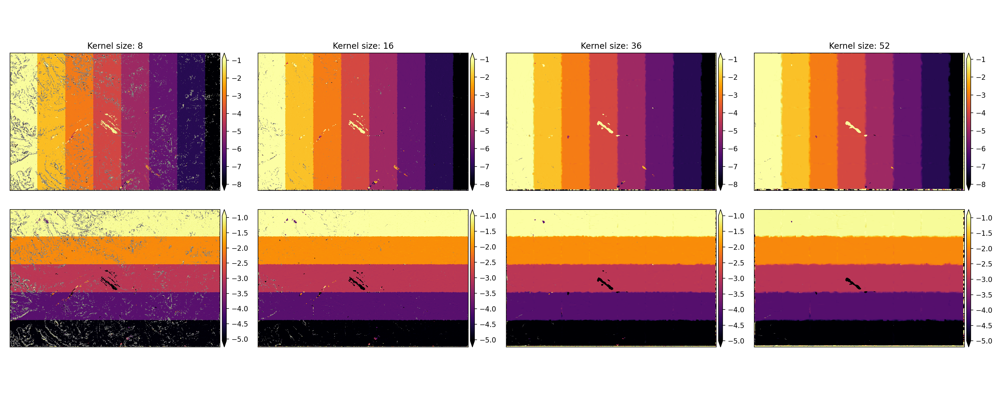

/nobackupp11/sbhusha1/sw/imview/imview/lib/pltlib.py:146: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("inferno"))
  cmap.set_bad('0.5', alpha=1)


In [6]:
f,axa = plt.subplots(2,4,figsize=(20,8))
ax = axa.ravel()
kernels = [8,16,36,52]
# plot the x component first

#vx_list = [iolib.fn_getma(x,1) for x in spm1_refinement]
vx_list = [vx_list[-1]] + vx_list[:-1]
vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vx in enumerate(vx_list):
    pltlib.iv(iolib.fn_getma(vx),ax=ax[idx],cmap='inferno',
              title=f'Kernel size: {kernels[idx]}')

# now plot the y component first

#vy_list = [iolib.fn_getma(x,2) for x in spm1_refinement]
#vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    pltlib.iv(iolib.fn_getma(vy),ax=ax[idx+4],cmap='inferno')
plt.tight_layout()

<IPython.core.display.Javascript object>


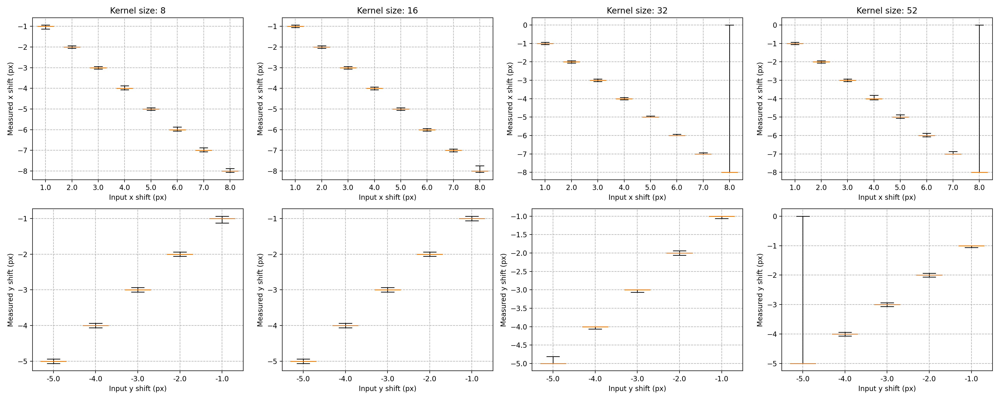


Warping all inputs to the following:
Resolution: 30.0
Extent: [585060.0, 6718005.0, 641550.0, 6754995.0]
Projection: '+proj=utm +zone=7 +datum=WGS84 +units=m +no_defs'
Resampling alg: near

1 of 2: vx_integer.tif
nl: 1233 ns: 1883 res: 30.000
2 of 2: ./multipixel_shifts/autoRIFT/fullbit/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_multi_pixel_synthetic_shift_min_min_chip_8.0_max_chip_8.0_skip_rate_2/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_warp__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_multi_pixel_synthetic_shift_warp_15.0_min_chip_8.0_max_chip_8.0_skip_rate_2-vx.tif
Unique values are:[1.0 2.0 3.0 4.0 5.0 6.0 7.0 8.0 --]
[1. 2. 3. 4. 5. 6. 7. 8.]

Warping all inputs to the following:
Resolution: 30.0
Extent: [585060.0, 6718005.0, 641550.0, 6754995.0]
Projection: '+proj=utm +zone=7 +datum=WGS84 +units=m +no_defs'
Resampling alg: near

1 of 2: vx_integer.tif
nl: 1233 ns: 1883 res: 30.000
2 of 2: ./multipixel_shifts/autoRIFT/fullb

In [9]:
f,axa = plt.subplots(2,4,figsize=(20,8))
ax = axa.ravel()
kernels = [8,16,32,52]
# plot the x component first
vx_input = iolib.fn_getma(vx_integer)
vy_input = iolib.fn_getma(vy_integer)
#vx_list = [iolib.fn_getma(x,1) for x in spm1_refinement]
#vx_list = [vx_list[-1]] + vx_list[:-1]

for idx,vx in enumerate(vx_list):
    plot_synthetic_boxplot(ax[idx],vx_integer,vx)
    ax[idx].set_title(f'Kernel size: {kernels[idx]}')
    ax[idx].set_xlabel('Input x shift (px)')
    ax[idx].set_ylabel('Measured x shift (px)')
    #vx,ax=ax[idx],cmap='inferno',title=f'Kernel size: {kernels[idx]}')

# now plot the y component

#vy_list = [iolib.fn_getma(x,2) for x in spm1_refinement]
#vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    plot_synthetic_boxplot(ax[idx+4],vy_integer,vy)
    ax[idx+4].set_xlabel('Input y shift (px)')
    ax[idx+4].set_ylabel('Measured y shift (px)')
plt.tight_layout()

### Measurements with deformation shifts

In [26]:
vx_deformation = 'vx_deformation.tif'
vy_deformation = 'vy_deformation.tif'
vx_list = sorted(glob.glob('./multipixel_shifts/autoRIFT/*deformation_synthetic_shift*/*vx.tif'))
vy_list = sorted(glob.glob('./multipixel_shifts/autoRIFT/*deformation_synthetic_shift*/*vy.tif'))
vx_list = [vx_list[-1]] + vx_list[:-1]
vy_list = [vy_list[-1]] + vy_list[:-1]

In [13]:
! ls $vx_deformation

vx_deformation.tif


In [14]:
! ls $vy_deformation

vy_deformation.tif


<IPython.core.display.Javascript object>


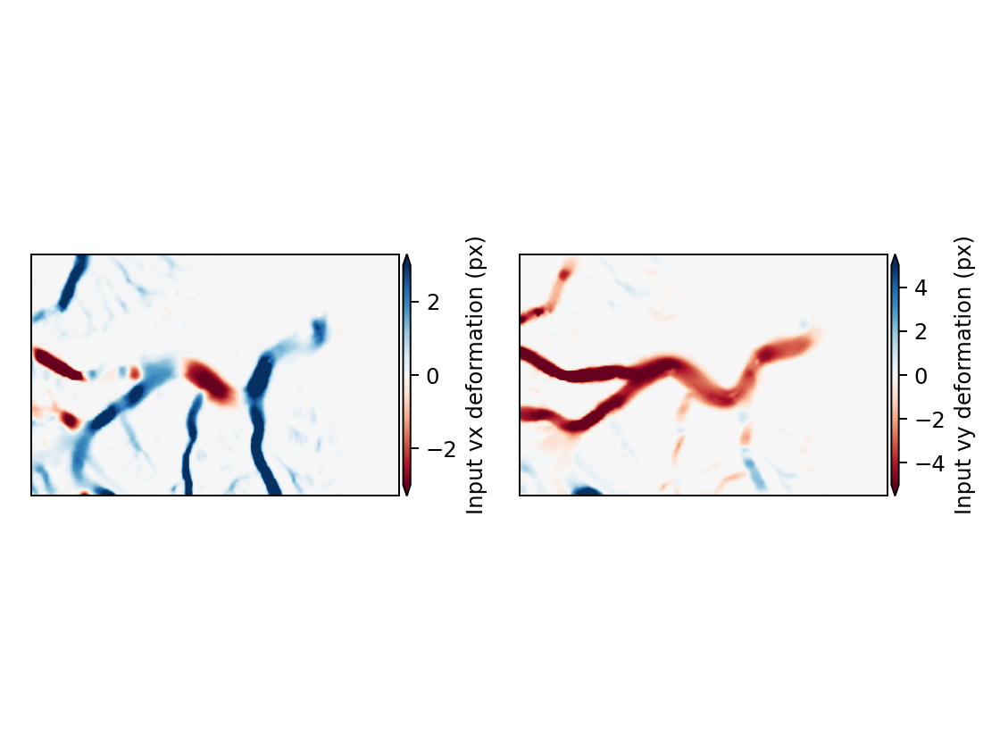

/nobackupp11/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("RdBu"))
  cmap.set_bad('k', alpha=1)


<AxesSubplot:>

In [43]:
f,ax = plt.subplots(1,2)
pltlib.iv_fn(vx_deformation,ax=ax[0],label='Input vx deformation (px)',
             scalebar=False,cmap='RdBu',clim=(-3,3))
pltlib.iv_fn(vy_deformation,ax=ax[1],label='Input vy deformation (px)',
             scalebar=False,cmap='RdBu',clim=(-5,5))

In [11]:
def plot_scatter(ax,v_input,v_output,r='near',factor=1):
    ds_list = warplib.memwarp_multi_fn([v_input,v_output],res='max',r=r)
    v_input,v_output = [iolib.ds_getma(ds) for ds in ds_list]
    mask = malib.common_mask([v_input,v_output])
    v_input = np.ma.array(v_input,mask=mask)
    v_output = factor*-1*np.ma.array(v_output,mask=mask)
    ax.scatter(v_input.compressed(),v_output.compressed(),s=1,c='r')
    #ax.hist2d(v_input.compressed(),v_output.compressed(),bins=50,cmap='inferno')
    # median absolute difference formula from here: https://en.wikipedia.org/wiki/Mean_absolute_difference
    # I changed the n2 to n, where n is the number of observations
    mad = np.round(np.sum(np.abs(v_input.compressed()-v_output.compressed()))/(
        v_input.count()),2)
    
    ax.text(x=0.75,y=0.9,
            s=f'CORR = {np.round(np.corrcoef(v_input.compressed(),v_output.compressed())[0,1],3)}\n MAD = {mad}',transform=ax.transAxes)
    ax.grid(linestyle='--')

<IPython.core.display.Javascript object>


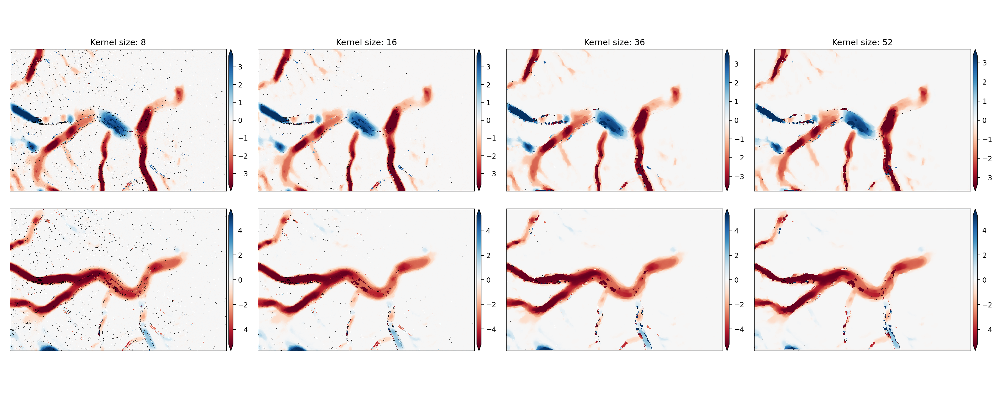

/nobackupp11/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("RdBu"))
  cmap.set_bad('k', alpha=1)


In [7]:
f,axa = plt.subplots(2,4,figsize=(20,8))
ax = axa.ravel()
kernels = [8,16,36,52]
# plot the x component first

#vx_list = [iolib.fn_getma(x,1) for x in spm1_refinement]


for idx,vx in enumerate(vx_list):
    pltlib.iv(iolib.fn_getma(vx),ax=ax[idx],cmap='RdBu',
              clim=malib.calcperc_sym(iolib.fn_getma(vx),perc=(2,98)),
              title=f'Kernel size: {kernels[idx]}')

# now plot the y component first

#vy_list = [iolib.fn_getma(x,2) for x in spm1_refinement]
#vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    pltlib.iv(iolib.fn_getma(vy),ax=ax[idx+4],cmap='RdBu',
              clim=malib.calcperc_sym(iolib.fn_getma(vy),perc=(2,98)))
plt.tight_layout()

<IPython.core.display.Javascript object>


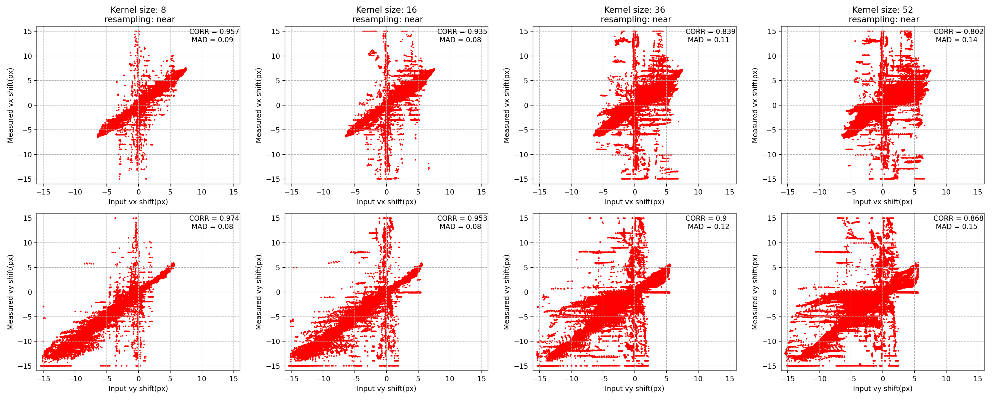


Warping all inputs to the following:
Resolution: 30.0
Extent: [585060.0, 6718005.0, 641550.0, 6754995.0]
Projection: '+proj=utm +zone=7 +datum=WGS84 +units=m +no_defs'
Resampling alg: near

1 of 2: vx_deformation.tif
nl: 1233 ns: 1883 res: 30.000
2 of 2: ./multipixel_shifts/autoRIFT/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_deformation_synthetic_shift_min_min_chip_8.0_max_chip_8.0_skip_rate_2/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_warp__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_deformation_synthetic_shift_warp_15.0_min_chip_8.0_max_chip_8.0_skip_rate_2-vx.tif

Warping all inputs to the following:
Resolution: 30.0
Extent: [585060.0, 6718005.0, 641550.0, 6754995.0]
Projection: '+proj=utm +zone=7 +datum=WGS84 +units=m +no_defs'
Resampling alg: near

1 of 2: vx_deformation.tif
nl: 1233 ns: 1883 res: 30.000
2 of 2: ./multipixel_shifts/autoRIFT/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s__LC08_L1TP_062017_20180903_20180912_01_T

In [27]:
f,axa = plt.subplots(2,4,figsize=(20,8))
ax = axa.ravel()
#kernels = [9,15,25,35,51]
# plot the x component first

clim = (-16,16)
r = 'near'
for idx,vx in enumerate(vx_list):
    
    plot_scatter(ax[idx],vx_deformation,vx,r=r)
    ax[idx].set_xlabel('Input vx shift(px)')
    ax[idx].set_ylabel('Measured vx shift(px)')
    ax[idx].set_xlim(clim[0],clim[1])
    ax[idx].set_ylim(clim[0],clim[1])
    ax[idx].set_title(f'Kernel size: {kernels[idx]}\n resampling: {r}')
    #pltlib.iv(vx,ax=ax[idx],cmap='RdBu',clim=malib.calcperc_sym(vx,perc=(2,98)),
     #         title=f'Kernel size: {kernels[idx]}')

# now plot the y component first


for idx,vy in enumerate(vy_list):
    
    plot_scatter(ax[idx+4],vy_deformation,vy,r=r,factor=-1)
    ax[idx+4].set_xlim(clim[0],clim[1])
    ax[idx+4].set_ylim(clim[0],clim[1])
    ax[idx+4].set_xlabel('Input vy shift(px)')
    ax[idx+4].set_ylabel('Measured vy shift(px)')
    #ax[idx+4].set_title(f'Kernel size: {kernels[idx]}')

plt.tight_layout()

In [31]:
%matplotlib notebook

<IPython.core.display.Javascript object>


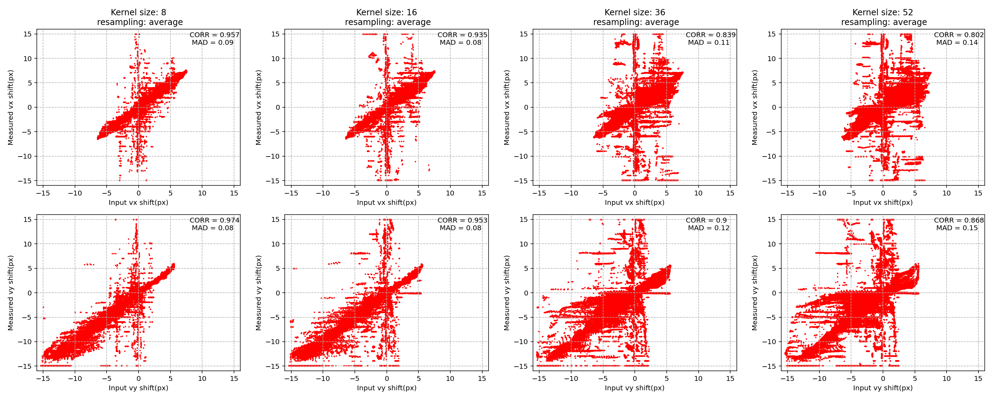


Warping all inputs to the following:
Resolution: 30.0
Extent: [585060.0, 6718005.0, 641550.0, 6754995.0]
Projection: '+proj=utm +zone=7 +datum=WGS84 +units=m +no_defs'
Resampling alg: average

1 of 2: vx_deformation.tif
nl: 1233 ns: 1883 res: 30.000
2 of 2: ./multipixel_shifts/autoRIFT/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_deformation_synthetic_shift_min_min_chip_8.0_max_chip_8.0_skip_rate_2/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_warp__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_deformation_synthetic_shift_warp_15.0_min_chip_8.0_max_chip_8.0_skip_rate_2-vx.tif

Warping all inputs to the following:
Resolution: 30.0
Extent: [585060.0, 6718005.0, 641550.0, 6754995.0]
Projection: '+proj=utm +zone=7 +datum=WGS84 +units=m +no_defs'
Resampling alg: average

1 of 2: vx_deformation.tif
nl: 1233 ns: 1883 res: 30.000
2 of 2: ./multipixel_shifts/autoRIFT/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s__LC08_L1TP_062017_20180903_2018091

In [32]:
f,axa = plt.subplots(2,4,figsize=(20,8))
ax = axa.ravel()
#kernels = [9,15,25,35,51]
# plot the x component first

clim = (-16,16)
r = 'average'
for idx,vx in enumerate(vx_list):
    
    plot_scatter(ax[idx],vx_deformation,vx,r=r)
    ax[idx].set_xlabel('Input vx shift(px)')
    ax[idx].set_ylabel('Measured vx shift(px)')
    ax[idx].set_xlim(clim[0],clim[1])
    ax[idx].set_ylim(clim[0],clim[1])
    ax[idx].set_title(f'Kernel size: {kernels[idx]}\n resampling: {r}')
    #pltlib.iv(vx,ax=ax[idx],cmap='RdBu',clim=malib.calcperc_sym(vx,perc=(2,98)),
     #         title=f'Kernel size: {kernels[idx]}')

# now plot the y component first


for idx,vy in enumerate(vy_list):
    
    plot_scatter(ax[idx+4],vy_deformation,vy,r=r,factor=-1)
    ax[idx+4].set_xlim(clim[0],clim[1])
    ax[idx+4].set_ylim(clim[0],clim[1])
    ax[idx+4].set_xlabel('Input vy shift(px)')
    ax[idx+4].set_ylabel('Measured vy shift(px)')
    #ax[idx+4].set_title(f'Kernel size: {kernels[idx]}')

plt.tight_layout()

#### Measurements with deformation shifts, at full bit depth

In [14]:
vx_deformation = 'vx_deformation.tif'
vy_deformation = 'vy_deformation.tif'
vx_list = sorted(glob.glob('./multipixel_shifts/autoRIFT/fullbit/*deformation_synthetic_shift*/*vx.tif'))
vy_list = sorted(glob.glob('./multipixel_shifts/autoRIFT/fullbit/*deformation_synthetic_shift*/*vy.tif'))
vx_list = [vx_list[-1]] + vx_list[:-1]
vy_list = [vy_list[-1]] + vy_list[:-1]

In [15]:
len(vx_list)

4

<IPython.core.display.Javascript object>


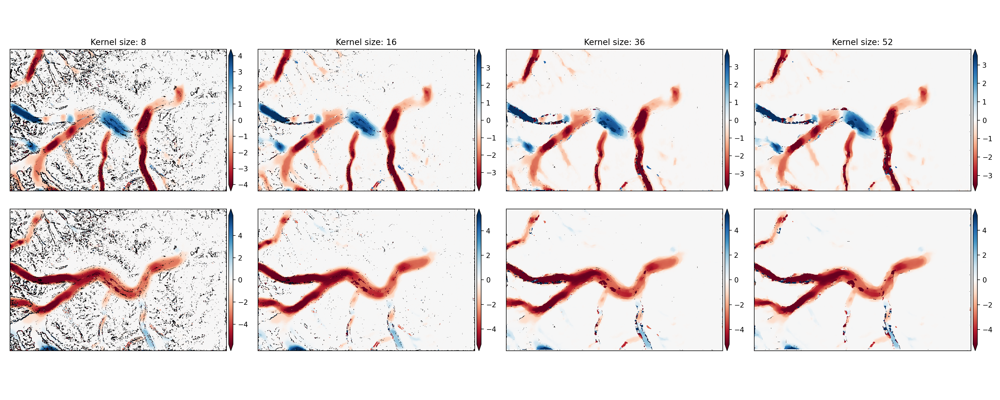

In [16]:
f,axa = plt.subplots(2,4,figsize=(20,8))
ax = axa.ravel()
kernels = [8,16,36,52]
# plot the x component first

#vx_list = [iolib.fn_getma(x,1) for x in spm1_refinement]


for idx,vx in enumerate(vx_list):
    pltlib.iv(iolib.fn_getma(vx),ax=ax[idx],cmap='RdBu',
              clim=malib.calcperc_sym(iolib.fn_getma(vx),perc=(2,98)),
              title=f'Kernel size: {kernels[idx]}')

# now plot the y component first

#vy_list = [iolib.fn_getma(x,2) for x in spm1_refinement]
#vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    pltlib.iv(iolib.fn_getma(vy),ax=ax[idx+4],cmap='RdBu',
              clim=malib.calcperc_sym(iolib.fn_getma(vy),perc=(2,98)))
plt.tight_layout()

<IPython.core.display.Javascript object>


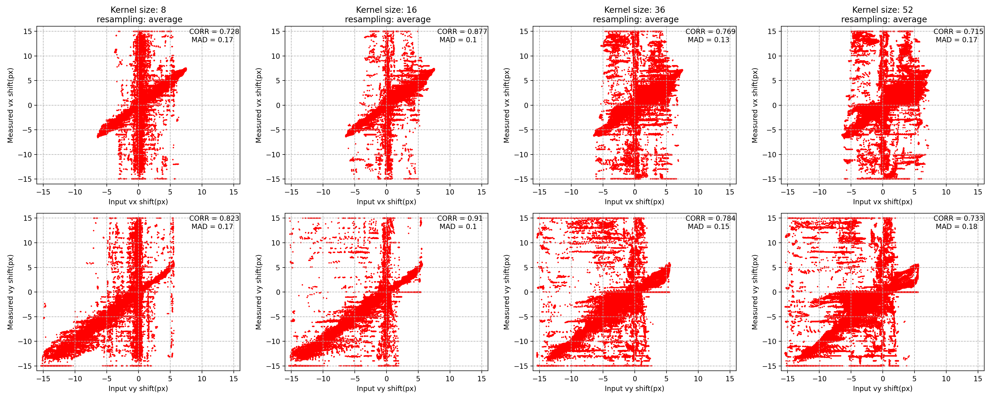


Warping all inputs to the following:
Resolution: 30.0
Extent: [585060.0, 6718005.0, 641550.0, 6754995.0]
Projection: '+proj=utm +zone=7 +datum=WGS84 +units=m +no_defs'
Resampling alg: average

1 of 2: vx_deformation.tif
nl: 1233 ns: 1883 res: 30.000
2 of 2: ./multipixel_shifts/autoRIFT/fullbit/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_deformation_synthetic_shift_min_min_chip_8.0_max_chip_8.0_skip_rate_2/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_warp__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_deformation_synthetic_shift_warp_15.0_min_chip_8.0_max_chip_8.0_skip_rate_2-vx.tif

Warping all inputs to the following:
Resolution: 30.0
Extent: [585060.0, 6718005.0, 641550.0, 6754995.0]
Projection: '+proj=utm +zone=7 +datum=WGS84 +units=m +no_defs'
Resampling alg: average

1 of 2: vx_deformation.tif
nl: 1233 ns: 1883 res: 30.000
2 of 2: ./multipixel_shifts/autoRIFT/fullbit/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s__LC08_L1TP_062017_

In [17]:
f,axa = plt.subplots(2,4,figsize=(20,8))
ax = axa.ravel()
#kernels = [9,15,25,35,51]
# plot the x component first

clim = (-16,16)
r = 'average'
for idx,vx in enumerate(vx_list):
    
    plot_scatter(ax[idx],vx_deformation,vx,r=r)
    ax[idx].set_xlabel('Input vx shift(px)')
    ax[idx].set_ylabel('Measured vx shift(px)')
    ax[idx].set_xlim(clim[0],clim[1])
    ax[idx].set_ylim(clim[0],clim[1])
    ax[idx].set_title(f'Kernel size: {kernels[idx]}\n resampling: {r}')
    #pltlib.iv(vx,ax=ax[idx],cmap='RdBu',clim=malib.calcperc_sym(vx,perc=(2,98)),
     #         title=f'Kernel size: {kernels[idx]}')

# now plot the y component first


for idx,vy in enumerate(vy_list):
    
    plot_scatter(ax[idx+4],vy_deformation,vy,r=r,factor=-1)
    ax[idx+4].set_xlim(clim[0],clim[1])
    ax[idx+4].set_ylim(clim[0],clim[1])
    ax[idx+4].set_xlabel('Input vy shift(px)')
    ax[idx+4].set_ylabel('Measured vy shift(px)')
    #ax[idx+4].set_title(f'Kernel size: {kernels[idx]}')

plt.tight_layout()

<IPython.core.display.Javascript object>


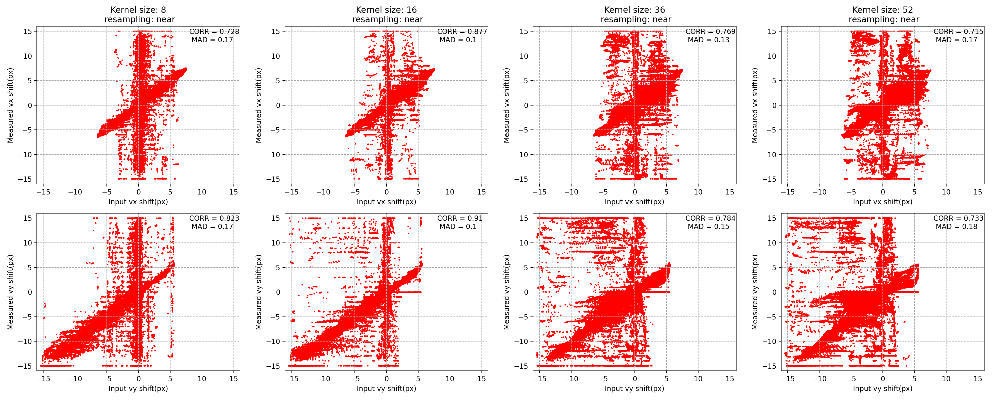


Warping all inputs to the following:
Resolution: 30.0
Extent: [585060.0, 6718005.0, 641550.0, 6754995.0]
Projection: '+proj=utm +zone=7 +datum=WGS84 +units=m +no_defs'
Resampling alg: near

1 of 2: vx_deformation.tif
nl: 1233 ns: 1883 res: 30.000
2 of 2: ./multipixel_shifts/autoRIFT/fullbit/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_deformation_synthetic_shift_min_min_chip_8.0_max_chip_8.0_skip_rate_2/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_warp__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_deformation_synthetic_shift_warp_15.0_min_chip_8.0_max_chip_8.0_skip_rate_2-vx.tif

Warping all inputs to the following:
Resolution: 30.0
Extent: [585060.0, 6718005.0, 641550.0, 6754995.0]
Projection: '+proj=utm +zone=7 +datum=WGS84 +units=m +no_defs'
Resampling alg: near

1 of 2: vx_deformation.tif
nl: 1233 ns: 1883 res: 30.000
2 of 2: ./multipixel_shifts/autoRIFT/fullbit/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s__LC08_L1TP_062017_201809

In [18]:
f,axa = plt.subplots(2,4,figsize=(20,8))
ax = axa.ravel()
#kernels = [9,15,25,35,51]
# plot the x component first

clim = (-16,16)
r = 'near'
for idx,vx in enumerate(vx_list):
    
    plot_scatter(ax[idx],vx_deformation,vx,r=r)
    ax[idx].set_xlabel('Input vx shift(px)')
    ax[idx].set_ylabel('Measured vx shift(px)')
    ax[idx].set_xlim(clim[0],clim[1])
    ax[idx].set_ylim(clim[0],clim[1])
    ax[idx].set_title(f'Kernel size: {kernels[idx]}\n resampling: {r}')
    #pltlib.iv(vx,ax=ax[idx],cmap='RdBu',clim=malib.calcperc_sym(vx,perc=(2,98)),
     #         title=f'Kernel size: {kernels[idx]}')

# now plot the y component first


for idx,vy in enumerate(vy_list):
    
    plot_scatter(ax[idx+4],vy_deformation,vy,r=r,factor=-1)
    ax[idx+4].set_xlim(clim[0],clim[1])
    ax[idx+4].set_ylim(clim[0],clim[1])
    ax[idx+4].set_xlabel('Input vy shift(px)')
    ax[idx+4].set_ylabel('Measured vy shift(px)')
    #ax[idx+4].set_title(f'Kernel size: {kernels[idx]}')

plt.tight_layout()

### Does the laplacian filter width influence the outlier vals, specially transition between moraine-ice transition

In [33]:
vx_deformation = 'vx_deformation.tif'
vy_deformation = 'vy_deformation.tif'
vx_list = sorted(glob.glob('./multipixel_shifts/autoRIFT/filter11/*deformation_synthetic_shift*/*vx.tif'))
vy_list = sorted(glob.glob('./multipixel_shifts/autoRIFT/filter11/*deformation_synthetic_shift*/*vy.tif'))
vx_list = [vx_list[-1]] + vx_list[:-1]
vy_list = [vy_list[-1]] + vy_list[:-1]

<IPython.core.display.Javascript object>


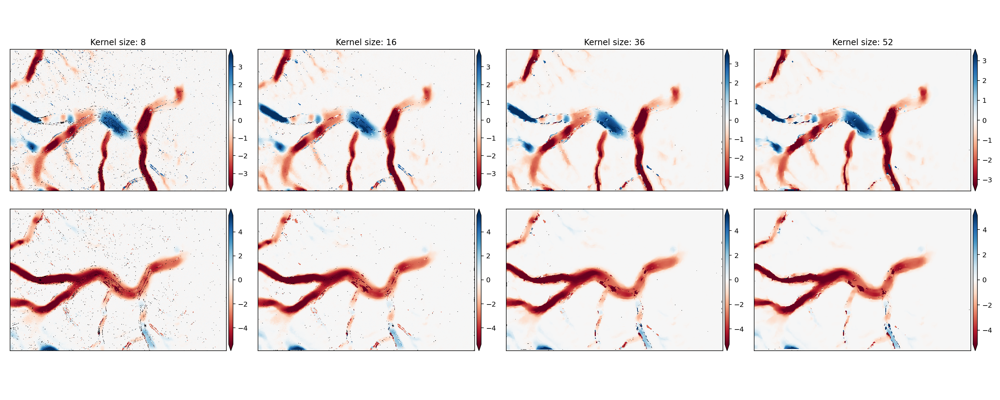

/nobackupp11/sbhusha1/sw/imview/imview/lib/pltlib.py:149: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. In future versions, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = copy.copy(mpl.cm.get_cmap("RdBu"))
  cmap.set_bad('k', alpha=1)


In [34]:
f,axa = plt.subplots(2,4,figsize=(20,8))
ax = axa.ravel()
kernels = [8,16,36,52]
# plot the x component first

#vx_list = [iolib.fn_getma(x,1) for x in spm1_refinement]


for idx,vx in enumerate(vx_list):
    pltlib.iv(iolib.fn_getma(vx),ax=ax[idx],cmap='RdBu',
              clim=malib.calcperc_sym(iolib.fn_getma(vx),perc=(2,98)),
              title=f'Kernel size: {kernels[idx]}')

# now plot the y component first

#vy_list = [iolib.fn_getma(x,2) for x in spm1_refinement]
#vy_list = [vy_list[-1]] + vy_list[:-1]

for idx,vy in enumerate(vy_list):
    pltlib.iv(iolib.fn_getma(vy),ax=ax[idx+4],cmap='RdBu',
              clim=malib.calcperc_sym(iolib.fn_getma(vy),perc=(2,98)))
plt.tight_layout()

<IPython.core.display.Javascript object>


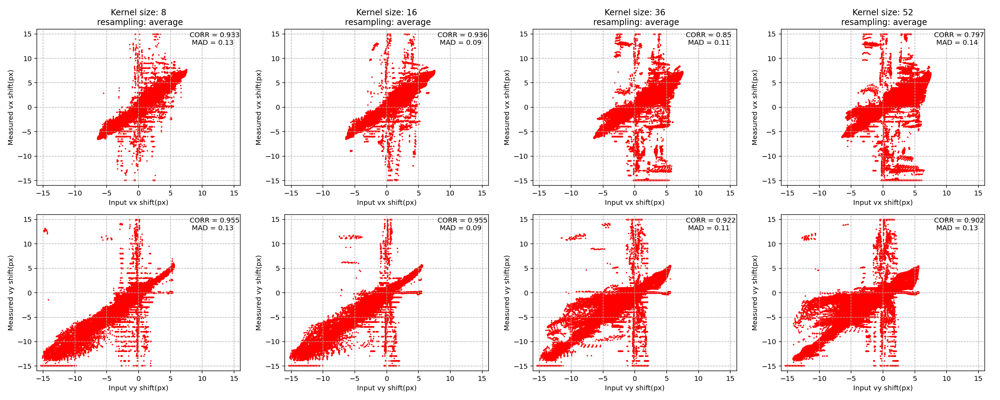


Warping all inputs to the following:
Resolution: 30.0
Extent: [585060.0, 6718005.0, 641550.0, 6754995.0]
Projection: '+proj=utm +zone=7 +datum=WGS84 +units=m +no_defs'
Resampling alg: average

1 of 2: vx_deformation.tif
nl: 1233 ns: 1883 res: 30.000
2 of 2: ./multipixel_shifts/autoRIFT/filter11/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_deformation_synthetic_shift_min_min_chip_8.0_max_chip_8.0_skip_rate_2/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_warp__LC08_L1TP_062017_20180903_20180912_01_T1_B8_s_deformation_synthetic_shift_warp_15.0_min_chip_8.0_max_chip_8.0_skip_rate_2-vx.tif

Warping all inputs to the following:
Resolution: 30.0
Extent: [585060.0, 6718005.0, 641550.0, 6754995.0]
Projection: '+proj=utm +zone=7 +datum=WGS84 +units=m +no_defs'
Resampling alg: average

1 of 2: vx_deformation.tif
nl: 1233 ns: 1883 res: 30.000
2 of 2: ./multipixel_shifts/autoRIFT/filter11/LC08_L1TP_062017_20180903_20180912_01_T1_B8_s__LC08_L1TP_06201

In [35]:
f,axa = plt.subplots(2,4,figsize=(20,8))
ax = axa.ravel()
#kernels = [9,15,25,35,51]
# plot the x component first

clim = (-16,16)
r = 'average'
for idx,vx in enumerate(vx_list):
    
    plot_scatter(ax[idx],vx_deformation,vx,r=r)
    ax[idx].set_xlabel('Input vx shift(px)')
    ax[idx].set_ylabel('Measured vx shift(px)')
    ax[idx].set_xlim(clim[0],clim[1])
    ax[idx].set_ylim(clim[0],clim[1])
    ax[idx].set_title(f'Kernel size: {kernels[idx]}\n resampling: {r}')
    #pltlib.iv(vx,ax=ax[idx],cmap='RdBu',clim=malib.calcperc_sym(vx,perc=(2,98)),
     #         title=f'Kernel size: {kernels[idx]}')

# now plot the y component first


for idx,vy in enumerate(vy_list):
    
    plot_scatter(ax[idx+4],vy_deformation,vy,r=r,factor=-1)
    ax[idx+4].set_xlim(clim[0],clim[1])
    ax[idx+4].set_ylim(clim[0],clim[1])
    ax[idx+4].set_xlabel('Input vy shift(px)')
    ax[idx+4].set_ylabel('Measured vy shift(px)')
    #ax[idx+4].set_title(f'Kernel size: {kernels[idx]}')

plt.tight_layout()

There is a wrong bias at locations where the input deformation was 0 pixels, but autoRIFT got significantly higher ranges of values between -15 to 15 px. Something is wrong in the measurements which needs to be fixed